In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# NN 
import  tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout,Embedding, SimpleRNN,Bidirectional,LSTM, GRU

# preprocessing
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing import sequence

In [2]:
pip install wordcloud

     -------------------------------------- 153.1/153.1 kB 8.9 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [2]:
df=pd.read_csv(r"C:\Users\amaan\Downloads\spam_ham_dataset.csv")

In [3]:
df

,Unnamed: 0,label,text,label_num
0,605,ham,Subject: enron methanol ; meter # : 988291\r\n...,0
1,2349,ham,"Subject: hpl nom for january 9 , 2001\r\n( see...",0
2,3624,ham,"Subject: neon retreat\r\nho ho ho , we ' re ar...",0
3,4685,spam,"Subject: photoshop , windows , office . cheap ...",1
4,2030,ham,Subject: re : indian springs\r\nthis deal is t...,0
...,...,...,...,...
5166,1518,ham,Subject: put the 10 on the ft\r\nthe transport...,0
5167,404,ham,Subject: 3 / 4 / 2000 and following noms\r\nhp...,0
5168,2933,ham,Subject: calpine daily gas nomination\r\n>\r\n...,0
5169,1409,ham,Subject: industrial worksheets for august 2000...,0


In [4]:
pos=' '.join(df[df["label_num"]==1]["text"])

In [5]:
pos

'Subject: photoshop , windows , office . cheap . main trending\r\nabasements darer prudently fortuitous undergone\r\nlighthearted charm orinoco taster\r\nrailroad affluent pornographic cuvier\r\nirvin parkhouse blameworthy chlorophyll\r\nrobed diagrammatic fogarty clears bayda\r\ninconveniencing managing represented smartness hashish\r\nacademies shareholders unload badness\r\ndanielson pure caffein\r\nspaniard chargeable levin\r\n Subject: looking for medication ? we ` re the best source .\r\nit is difficult to make our material condition better by the best law , but it is easy enough to ruin it by bad laws .\r\nexcuse me . . . : ) you just found the\r\nbest and simpliest site for\r\nmedication on the net . no perscription , easy\r\ndelivery .\r\nprivate , secure , and easy .\r\nbetter see rightly on a pound a week than squint on a million .\r\nwe ` ve got\r\nanything that you will ever want .\r\nerection treatment pills , anti - depressant pills , weight loss , and\r\nmore ! http : /

In [6]:
neg=' '.join(df[df["label_num"]==0]["text"])

In [7]:
neg

'Subject: enron methanol ; meter # : 988291\r\nthis is a follow up to the note i gave you on monday , 4 / 3 / 00 { preliminary\r\nflow data provided by daren } .\r\nplease override pop \' s daily volume { presently zero } to reflect daily\r\nactivity you can obtain from gas control .\r\nthis change is needed asap for economics purposes . Subject: hpl nom for january 9 , 2001\r\n( see attached file : hplnol 09 . xls )\r\n- hplnol 09 . xls Subject: neon retreat\r\nho ho ho , we \' re around to that most wonderful time of the year - - - neon leaders retreat time !\r\ni know that this time of year is extremely hectic , and that it \' s tough to think about anything past the holidays , but life does go on past the week of december 25 through january 1 , and that \' s what i \' d like you to think about for a minute .\r\non the calender that i handed out at the beginning of the fall semester , the retreat was scheduled for the weekend of january 5 - 6 . but because of a youth ministers confe

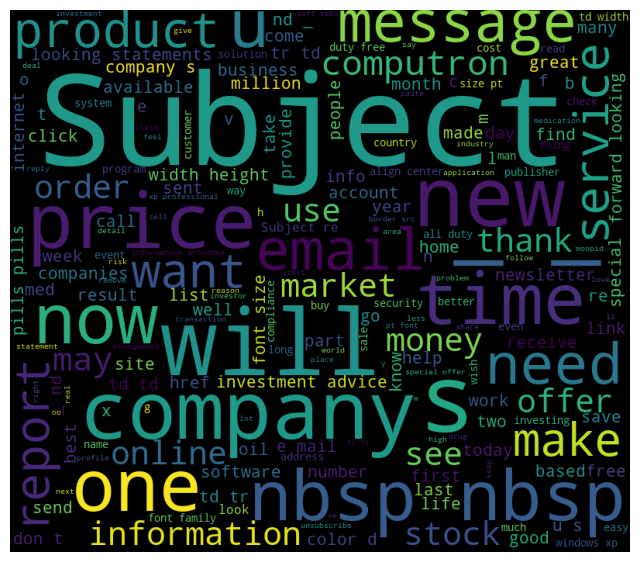

In [10]:
#WordCloud,
#plot
wc=WordCloud(width=800,height=700,min_font_size=10)
wc.generate(pos)
plt.figure(figsize=(8,8))
plt.imshow(wc)
plt.axis("off")
plt.show()

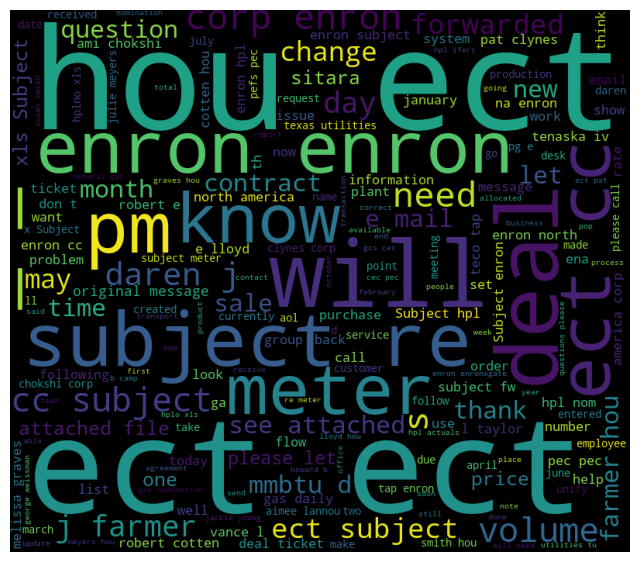

In [11]:
wc=WordCloud(width=800,height=700,min_font_size=10)
wc.generate(neg)
plt.figure(figsize=(8,8))
plt.imshow(wc)
plt.axis("off")
plt.show()


In [8]:
x=df['text']
y=df['label_num']

In [9]:
x

0       Subject: enron methanol ; meter # : 988291\r\n...
1       Subject: hpl nom for january 9 , 2001\r\n( see...
2       Subject: neon retreat\r\nho ho ho , we ' re ar...
3       Subject: photoshop , windows , office . cheap ...
4       Subject: re : indian springs\r\nthis deal is t...
                              ...                        
5166    Subject: put the 10 on the ft\r\nthe transport...
5167    Subject: 3 / 4 / 2000 and following noms\r\nhp...
5168    Subject: calpine daily gas nomination\r\n>\r\n...
5169    Subject: industrial worksheets for august 2000...
5170    Subject: important online banking alert\r\ndea...
Name: text, Length: 5171, dtype: object

In [10]:
y

0       0
1       0
2       0
3       1
4       0
       ..
5166    0
5167    0
5168    0
5169    0
5170    1
Name: label_num, Length: 5171, dtype: int64

In [11]:
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.3,random_state=1)

In [12]:
#Tokenization

tok= Tokenizer()
tok.fit_on_texts(xtrain)

In [13]:
voc=tok.index_word
print(voc)

{1: '\r', 2: 'the', 3: 'to', 4: 'and', 5: 'ect', 6: 'for', 7: 'of', 8: 'a', 9: "'", 10: 'subject', 11: 'you', 12: 'in', 13: 'hou', 14: 'on', 15: 'is', 16: 'this', 17: 'i', 18: 'enron', 19: 'be', 20: 'that', 21: 'we', 22: 'from', 23: 'have', 24: 'will', 25: 'your', 26: 'with', 27: 'at', 28: 'it', 29: 'are', 30: 's', 31: '2000', 32: 'com', 33: 'as', 34: 'if', 35: 'please', 36: 'by', 37: 'not', 38: 'or', 39: 'gas', 40: '3', 41: '1', 42: 'deal', 43: 'me', 44: 'cc', 45: 'meter', 46: '2', 47: 'hpl', 48: 'ect\r', 49: '10', 50: '000', 51: 're', 52: 'can', 53: 'our', 54: 'daren', 55: 'any', 56: 'e', 57: 'all', 58: 'corp', 59: 'd', 60: 'thanks', 61: 'the\r', 62: '2001', 63: 'was', 64: '01', 65: '00', 66: 'know', 67: 'has', 68: '5', 69: '4', 70: 'pm\r', 71: 'an', 72: 'need', 73: '0', 74: 'new', 75: 'may', 76: '11', 77: 'no', 78: 'do', 79: 't', 80: 'up', 81: 'forwarded', 82: 'j', 83: '12', 84: 'should', 85: 'http', 86: 'am', 87: 'get', 88: 'there', 89: '2000\r', 90: '03', 91: 'am\r', 92: 'mmbtu', 

In [14]:
voclen=len(voc)

In [15]:
# sequence
trainseq=tok.texts_to_sequences(xtrain)

In [16]:
trainseq

[[10,
  47,
  605,
  6,
  205,
  200,
  62,
  4,
  214,
  41,
  46,
  276,
  94,
  103,
  172,
  538,
  6803,
  123,
  94,
  103,
  172,
  538,
  7597,
  123,
  1,
  538,
  6803,
  930,
  538,
  7597,
  123],
 [10,
  435,
  10411,
  294,
  6,
  69,
  41,
  69,
  46,
  89,
  54,
  1,
  2,
  407,
  45,
  693,
  14,
  2,
  1366,
  294,
  6,
  40,
  31,
  17,
  67,
  180,
  6,
  2,
  203,
  5663,
  220,
  7,
  16,
  140,
  149,
  42,
  20099,
  42,
  5664,
  40,
  200,
  31,
  1,
  52,
  11,
  35,
  94,
  34,
  2,
  42,
  52,
  19,
  960,
  38,
  34,
  2,
  39,
  84,
  19,
  10412,
  14,
  3566,
  9,
  30,
  1,
  399,
  310,
  1,
  40,
  2708],
 [10,
  2014,
  502,
  6,
  1411,
  4,
  4632,
  606,
  27,
  2,
  303,
  7,
  4633,
  20100,
  35,
  360,
  103,
  8,
  471,
  7,
  2,
  183,
  1,
  2014,
  138,
  3934,
  456,
  4926,
  6,
  1411,
  606,
  456,
  5289,
  6,
  4632,
  606,
  35,
  508,
  4,
  34,
  941,
  12,
  3127,
  96,
  502,
  12,
  430,
  222,
  132,
  43,
  57,
  983,
  99,


In [17]:
doclen=[]
for i in trainseq:
  doclen.append(len(i))

print(doclen)

[31, 70, 163, 19, 58, 18, 159, 111, 642, 49, 103, 53, 369, 40, 308, 44, 115, 84, 59, 111, 49, 183, 177, 78, 59, 32, 1280, 72, 92, 227, 203, 296, 395, 22, 143, 17, 60, 2126, 44, 89, 349, 145, 174, 85, 3, 174, 252, 59, 6, 393, 136, 221, 415, 896, 465, 521, 190, 5, 6, 187, 393, 38, 10, 102, 135, 355, 19, 22, 497, 427, 245, 218, 747, 63, 23, 166, 1243, 106, 240, 17, 75, 51, 141, 128, 11, 95, 195, 250, 68, 11, 66, 64, 22, 2, 360, 142, 449, 162, 108, 138, 123, 131, 97, 428, 235, 102, 35, 223, 121, 40, 17, 86, 12, 362, 516, 66, 24, 173, 104, 26, 102, 323, 40, 71, 237, 61, 121, 45, 342, 82, 245, 28, 165, 236, 24, 23, 10, 56, 48, 32, 378, 254, 151, 174, 430, 1596, 37, 83, 19, 313, 99, 131, 91, 174, 33, 38, 448, 8, 182, 133, 198, 37, 413, 63, 122, 13, 82, 89, 17, 44, 86, 686, 48, 56, 13, 687, 183, 121, 95, 35, 54, 459, 68, 55, 197, 382, 289, 120, 17, 25, 37, 106, 19, 361, 222, 51, 71, 48, 32, 53, 62, 357, 111, 74, 206, 69, 235, 18, 571, 17, 941, 51, 17, 54, 64, 56, 190, 169, 88, 26, 278, 575, 22

In [18]:
max(doclen)

5916

In [19]:
np.quantile(doclen,0.99)

1156.3800000000015

In [20]:
max_length=1156
trainmatrix=sequence.pad_sequences(trainseq,maxlen=max_length)

In [21]:
trainmatrix

array([[    0,     0,     0, ...,   538,  7597,   123],
       [    0,     0,     0, ...,     1,    40,  2708],
       [    0,     0,     0, ...,  3567,   985,   705],
       ...,
       [    0,     0,     0, ...,    32,  2765,  1116],
       [    0,     0,     0, ..., 11970,    40, 13003],
       [    0,     0,     0, ...,  2366,   381,   123]])

In [22]:
# sequence
testseq=tok.texts_to_sequences(xtest)
testmatrix=sequence.pad_sequences(testseq,maxlen=max_length)

In [28]:
# LSTM
model4=Sequential()
model4.add(Embedding(input_dim=voclen+1,
          output_dim=100,
          input_length=max_length,
          mask_zero=True))

model4.add(LSTM(32))
model4.add(Dense(16,activation="relu"))
model4.add(Dropout(0.2))
model4.add(Dense(8,activation="relu"))
model4.add(Dense(1,activation="sigmoid"))

In [29]:
model4.compile(optimizer="adam",loss="binary_crossentropy",metrics="accuracy")
model4.fit(trainmatrix,ytrain,epochs=2,batch_size=128)

Epoch 1/2
29/29 [==============================] - 52s 2s/step - loss: 0.6432 - accuracy: 0.7027
Epoch 2/2
29/29 [==============================] - 45s 2s/step - loss: 0.3612 - accuracy: 0.8397


In [30]:
ypred=model4.predict(testmatrix)
ypred=np.where(ypred>=0.5,1,0)
print(classification_report(ytest,ypred))

49/49 [==============================] - 12s 187ms/step
              precision    recall  f1-score   support

           0       0.85      1.00      0.92      1101
           1       0.98      0.56      0.72       451

    accuracy                           0.87      1552
   macro avg       0.92      0.78      0.82      1552
weighted avg       0.89      0.87      0.86      1552



In [31]:
model5=Sequential()
model5.add(Embedding(input_dim=voclen+1,
          output_dim=100,
          input_length=max_length,
          mask_zero=True))

model5.add(LSTM(32))
model5.add(Dense(16,activation="relu"))
model5.add(Dropout(0.2))
model5.add(Dense(8,activation="relu"))
model5.add(Dense(1,activation="sigmoid"))


model5.compile(optimizer="adam",loss="binary_crossentropy",metrics="accuracy")
model5.fit(trainmatrix,ytrain,epochs=10,batch_size=32)
ypred=model5.predict(testmatrix)
ypred=np.where(ypred>=0.5,1,0)
print(classification_report(ytest,ypred))

Epoch 1/10
114/114 [==============================] - 88s 723ms/step - loss: 0.3812 - accuracy: 0.8154
Epoch 2/10
114/114 [==============================] - 85s 745ms/step - loss: 0.0597 - accuracy: 0.9856
Epoch 3/10
114/114 [==============================] - 94s 825ms/step - loss: 0.0091 - accuracy: 0.9983
Epoch 4/10
114/114 [==============================] - 95s 833ms/step - loss: 0.0092 - accuracy: 0.9983
Epoch 5/10
114/114 [==============================] - 94s 824ms/step - loss: 0.0016 - accuracy: 1.0000
Epoch 6/10
114/114 [==============================] - 94s 827ms/step - loss: 8.5563e-04 - accuracy: 1.0000
Epoch 7/10
114/114 [==============================] - 93s 814ms/step - loss: 6.0993e-04 - accuracy: 1.0000
Epoch 8/10
114/114 [==============================] - 94s 822ms/step - loss: 6.5961e-04 - accuracy: 1.0000
Epoch 9/10
114/114 [==============================] - 94s 824ms/step - loss: 3.0801e-04 - accuracy: 1.0000
Epoch 10/10
49/49 [==============================] - 14s 

In [23]:
# NN
model=Sequential()
model.add(Embedding(input_dim=voclen+1,
          output_dim=100,
          input_length=max_length,
          mask_zero=True))
model.add(SimpleRNN(32))
model.add(Dense(16,activation="relu"))
model.add(Dense(8,activation="relu"))
model.add(Dense(1,activation="sigmoid"))

In [24]:
model.compile(optimizer="adam",loss="binary_crossentropy",metrics="accuracy")
model.fit(trainmatrix,ytrain,epochs=10,batch_size=32)


Epoch 1/10
114/114 [==============================] - 64s 529ms/step - loss: 0.3762 - accuracy: 0.8262
Epoch 2/10
114/114 [==============================] - 62s 547ms/step - loss: 0.0721 - accuracy: 0.9815
Epoch 3/10
114/114 [==============================] - 67s 591ms/step - loss: 0.0117 - accuracy: 0.9981
Epoch 4/10
114/114 [==============================] - 61s 536ms/step - loss: 0.0040 - accuracy: 0.9997
Epoch 5/10
114/114 [==============================] - 68s 602ms/step - loss: 0.0014 - accuracy: 1.0000
Epoch 6/10
114/114 [==============================] - 69s 604ms/step - loss: 6.5744e-04 - accuracy: 1.0000
Epoch 7/10
114/114 [==============================] - 69s 609ms/step - loss: 0.0017 - accuracy: 0.9997
Epoch 8/10
114/114 [==============================] - 69s 606ms/step - loss: 3.6337e-04 - accuracy: 1.0000
Epoch 9/10
114/114 [==============================] - 69s 601ms/step - loss: 2.4892e-04 - accuracy: 1.0000
Epoch 10/10
114/114 [==============================] - 74s 65

In [25]:
ypred=model.predict(testmatrix)
ypred=np.where(ypred>=0.5,1,0)
print(classification_report(ytest,ypred))

49/49 [==============================] - 9s 133ms/step
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1101
           1       0.97      0.98      0.97       451

    accuracy                           0.98      1552
   macro avg       0.98      0.98      0.98      1552
weighted avg       0.98      0.98      0.98      1552

